In [0]:
%pip install pytorch-lightning==1.5.6
%pip install grad-cam

# Preface

## Project and data description

__Project 14. Develop medical decision support based on the Pneumonia data set.__ <br>
Pneumoinia X-RAY data: https://www.kaggle.com/tolgadincer/labeled-chest-xray-images

This dataset contains 5,856 validated Chest X-Ray images. The images are split into a training set and a testing set of independent patients. Images are labeled as (disease:NORMAL/BACTERIA/VIRUS)-(randomized patient ID)-(image number of a patient).

Chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients of one to five years old from Guangzhou Women and Children’s Medical Center, Guangzhou. All chest X-ray imaging was performed as part of patients’ routine clinical care.

For the analysis of chest x-ray images, all chest radiographs were initially screened for quality control by removing all low quality or unreadable scans. The diagnoses for the images were then graded by two expert physicians before being cleared for training the AI system. In order to account for any grading errors, the evaluation set was also checked by a third expert.

## What is Pneumonia?

Pneumonia results from an infection which causes the __air sacs__ in the lungs to become __filled with fluid or pus__. <br>
One test a doctor will perform is a __chest x-ray__, which allows him/her to see __fluid around the lungs__. <br>

The __type of pneumonia__ you have will determine your __treatment options__. <br>
__Bacteria__ tend to aggressively attack one section of the lung, which is __treated with antibiotics__ and can be seen on an __x-ray by a white condensed area or opacity__ with the other areas have normal air exchange. <br>
__Viruses__ affect both sides of the lung by causing a more homogeneous inflammatory reaction that shows up as a __more diffuse involvement on x-rays__ and requires __rest along with medication to manage the fever__. <br>

Having __pneumonia can be frightening__ because this illness directly impacts our breathing.

_______________________________________________________________________________________________________________________________

In [0]:
# common imports
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import seaborn as sns
import os
from PIL import Image
import mlflow

# pytorch and lightning
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Dataset
import torchvision.models as models
from torchvision import transforms
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from torchmetrics.functional import accuracy, f1
from torchmetrics import ConfusionMatrix

# GradCAM
from pytorch_grad_cam import GradCAM 
from pytorch_grad_cam.utils.image import show_cam_on_image
# SHAP
import shap

# sklearn
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler

torch.manual_seed(42)
mlflow.set_experiment(experiment_id=238211019831786)
mlflow.pytorch.autolog()

2022/02/01 08:30:41 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of pytorch. If you encounter errors during autologging, try upgrading / downgrading pytorch to a supported version, or try upgrading MLflow.
2022/02/01 08:30:41 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/local_disk0/.ephemeral_nfs/envs/pythonEnv-680f60c2-1d97-4c19-ba0c-c381198a5c70/lib/python3.8/site-packages/pytorch_lightning/core/memory.py:16: LightningDeprecationWarning: `pytorch_lightning.core.memory.get_memory_profile` and `pytorch_lightning.core.memory.get_gpu_memory_map` have been moved to `pytorch_lightning.utilities.memory` since v1.5 and will be removed in v1.7."
2022/02/01 08:30:41 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/local_disk0/.ephemeral_nfs/envs/pythonEnv-680f60c2-1d97-4c19-ba0c-c381198a5c70/lib/python3.8/site-packages/pytorch_lightning/core/memory.py:25: LightningDeprecationWarning: `pytorch_lightning.core.memory.LayerSummary` and `pytorch_lightning.core.memory.ModelSummary` have been moved to `pytorch_lightning.utilities.model_summary` since v1.5 and will be removed in v1.7."

In [0]:
torch.cuda.get_device_name(0)

Out[3]: 'Tesla V100-PCIE-16GB'

# Pneumonia Dataset

In [0]:
filepath = "/dbfs/mnt/dslwedevstadata01/test-data/pneumonia_data/"
filepath_train = filepath + 'train/'
filepath_test = filepath + 'test/'
filepath_plots = "/dbfs/FileStore/plots/pneumonia/"

In [0]:
transforms_train = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,), std=(0.5,))])

# only resize transform for testing
transforms_test = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

In [0]:
class PneuominaDataset(Dataset):
  def __init__(self, data_dir, transform, binary_detection=False):
      self.data_dir = data_dir
      self.transform = transform
      self.images = []
      self.labels = []
      if binary_detection:
        self.label2name = {0: "Normal", 1: "Pneumonia"}
      else:
        self.label2name = {0: "Normal", 1: "Bacteria", 2: "Virus"}

      for dname in os.listdir(self.data_dir):
          fpath = os.path.join(self.data_dir, dname)
          for fname in os.listdir(fpath):
              # filename paths
              self.images.append(os.path.join(fpath, fname))
              # labels
              if 'NORMAL' in fname.split('-')[0]:
                  self.labels.append(0)
              elif 'BACTERIA' in fname.split('-')[0]:
                  self.labels.append(1)
              elif 'VIRUS' in fname.split('-')[0]:
                if binary_detection:
                  self.labels.append(1)  # change it to an binary classification problem
                else:                    
                  self.labels.append(2)
              else:
                  self.labels.append(None)

  def __len__(self):
      return len(self.images)

  def __getitem__(self, idx):
      img = Image.open(self.images[idx]).convert('RGB')
      if self.transform is not None:
          img = self.transform(img)
      else:
          img = np.array(img).astype('float32')
      return img, self.labels[idx]

  def split(self, start, end):
      return self.labels[start:end+1]

  def show_image(self, idx, manual_transform=None):
      img = Image.open(self.images[idx]).convert('RGB')
      if manual_transform:
        img = manual_transform(img)[0]
      plt.imshow(img, cmap='gray')
      plt.title(self.label2name[self.labels[idx]])

  def show_rand_images(self, n_rows, n_cols, manual_transform=None):
    idxs = np.random.randint(self.__len__(), size=n_rows*n_cols)
    fig = plt.figure(figsize=(n_rows*4,n_cols*4))
    for i, idx in enumerate(idxs):
      fig.add_subplot(n_rows, n_cols, i+1)
      self.show_image(idx, manual_transform)

In [0]:
def split_train_valid(data, val_pct=0.2):
  train, valid = torch.utils.data.random_split(data, 
                                               [len(data)-int(len(data)*val_pct),
                                                int(len(data)*val_pct)])
  return train, valid

## Pneumonia Type Detection
Multiclass-Classification-Problem

In [0]:
data_train_multi = PneuominaDataset(filepath_train, transforms_train, binary_detection=False)
train_multi, valid_multi = split_train_valid(data_train_multi)  
test_multi = PneuominaDataset(filepath_test, transforms_test, binary_detection=False)

batch_size_multi = 64
train_dataloader_multi = DataLoader(train_multi, batch_size=batch_size_multi, shuffle=True, 
                                    num_workers=6, pin_memory=True)
valid_dataloader_multi = DataLoader(valid_multi, batch_size=batch_size_multi, shuffle=False, 
                                    num_workers=6, pin_memory=True)
test_dataloader_multi = DataLoader(test_multi, batch_size=batch_size_multi, shuffle=False, 
                                    num_workers=6, pin_memory=True)

for X, y in test_dataloader_multi:
    print("Shape of X [N, C, H, W]: ", X.shape)
    print("Shape of y: ", y.shape, y.dtype)
    break

Shape of X [N, C, H, W]: torch.Size([64, 3, 224, 224])
Shape of y: torch.Size([64]) torch.int64

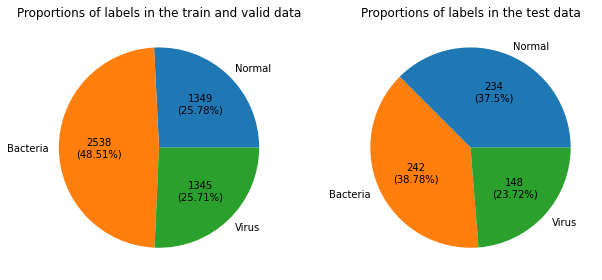

Out[9]: (4186, 1046, 624)

In [0]:
def plot_label_pie(data):
  label_proportion = np.unique(data.labels, return_counts=True)
  p, tx, atx = plt.pie(label_proportion[1], labels=data.label2name.values(), autopct='')
  for i, a in enumerate(atx):
    a.set_text("{}\n({}%)".format(label_proportion[1][i], np.round(label_proportion[1][i]/len(data)*100,2)))
  
fig = plt.figure(figsize=(9,4))
fig.add_subplot(121)
plot_label_pie(data_train_multi)
plt.title("Proportions of labels in the train and valid data")

fig.add_subplot(122)
plot_label_pie(test_multi)
plt.title("Proportions of labels in the test data")
plt.tight_layout()
plt.savefig(filepath_plots+'label_dist.pdf')
plt.show()
len(train_multi), len(valid_multi), len(test_multi)

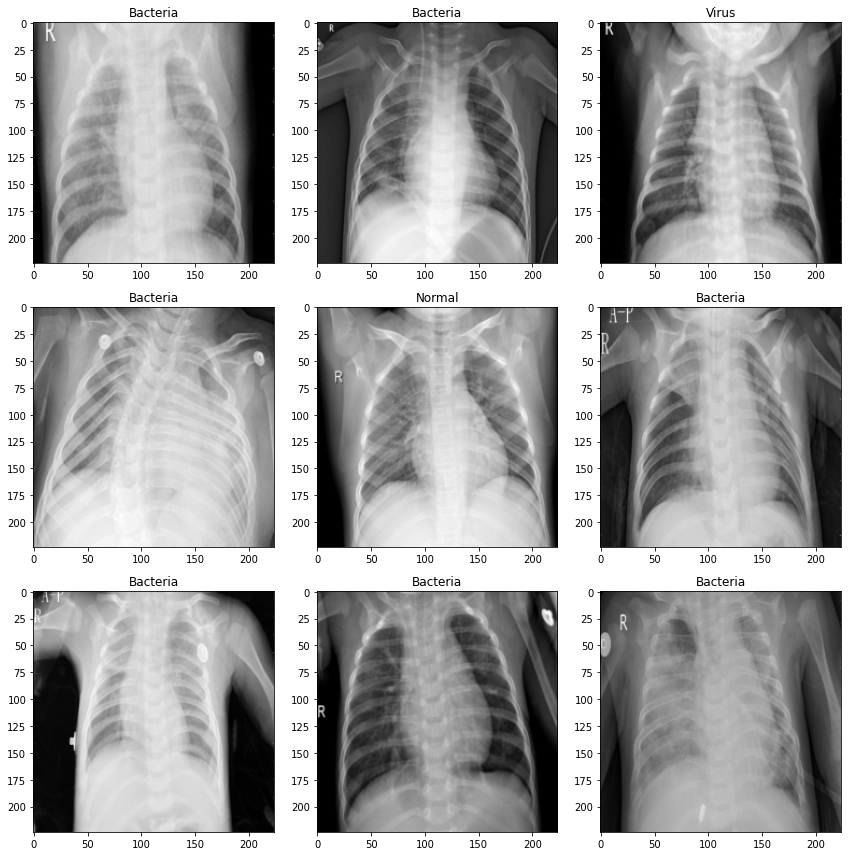

In [0]:
data_train_multi.show_rand_images(3,3, transforms_test)
plt.tight_layout()
plt.savefig(filepath_plots+'sample_xrays.pdf')

# Modeling of medical decision support
Tuning approaches (max á 100 epochs per approach):
- ResNet18 & ResNet50 as backbone net 
- Auto Batch Size --> dataset too small
- Tune Learning Rate
- Early Stopping 
- Transfer Learning: MLP only for mapping (succesfull)
- Transfer Learning: Train MLP + last layer / residual  block (>10M Params) --> overitting
- Transfer Learning: Train everything with a very low learning rate (1e-5, 1e-6) --> overfitting

## Define ResNet18

In [0]:
class ResNet(LightningModule):
  def __init__(self, lr=1e-3, n_classes=3, bs=64):
      super().__init__()
      self.learning_rate = lr
      self.num_target_classes = n_classes
      self.batch_size = bs

      # init a pretrained resnet on ImageNet
      backbone = models.resnet18(pretrained=True)
      num_filters = backbone.fc.in_features
      layers = list(backbone.children())[:-1]
      self.feature_extractor = nn.Sequential(*layers)
      self.classifier = nn.Linear(num_filters, self.num_target_classes)

  def forward(self, x):
      self.feature_extractor.eval()
      with torch.no_grad():
          representations = self.feature_extractor(x).flatten(1)
      return self.classifier(representations)

  def training_step(self, batch, batch_idx):
      x, y = batch
      y_pred = self(x)
      loss = F.cross_entropy(y_pred, y)
      return loss

  def validation_step(self, batch, batch_idx):
      x, y = batch
      logits = self(x)
      loss = F.nll_loss(logits, y)
      preds = torch.argmax(logits, dim=1)
      f1_score = f1(preds, y, num_classes=self.num_target_classes, average='micro')

      # Calling self.log will surface up scalars in TensorBoard
      self.log("val_loss", loss, prog_bar=False, on_step=False, on_epoch=True, sync_dist=False)
      self.log("val_f1_score", f1_score, prog_bar=False, on_step=False, on_epoch=True, sync_dist=False)
      return loss

  def test_step(self, batch, batch_idx):
      # just reusing the validation_step for testing
      return self.validation_step(batch, batch_idx)

  def configure_optimizers(self):
      optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
      return optimizer

  def train_dataloader(self):
    return DataLoader(train, batch_size=self.batch_size, num_workers=6, pin_memory=True)

## Pytorch Lightning Tuner

In [0]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=0.01, patience=20, verbose=False, mode="min")

trainer = Trainer(max_epochs=15, 
                  gpus=1, 
                  log_every_n_steps=10, 
                  callbacks=[early_stop_callback],
                  auto_lr_find=True,)
                 # auto_scale_batch_size='power')

model = ResNet(n_classes=3, bs=batch_size_multi)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
 0%| | 0.00/44.7M [00:00<?, ?B/s]

__Autoselecting Batch Size__ <br>
Dataset is too small to profit from a big batch size

In [0]:
#trainer.tuner.scale_batch_size(model_multi)

__Find best Learning Rate with cyclical learning rates instead of fixed values__ <br>
see https://arxiv.org/abs/1506.01186 for further information

It is recommended to not pick the learning rate that achieves the lowest loss, but instead something in the middle of the sharpest downward slope (red point).

In [0]:
lr_finder = trainer.tuner.lr_find(model, train_dataloader_multi, valid_dataloader_multi, num_training=100)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
The `f1` was deprecated since v0.7 in favor of `torchmetrics.functional.classification.f_beta.f1_score`. It will be removed in v0.8.
Finding best initial lr: 0%| | 0/100 [00:00<?, ?it/s]
Restoring states from the checkpoint path at /databricks/driver/lr_find_temp_model_374ae0d5-ac97-4b09-a9a3-eda21e58ff5e.ckpt

Out[118]:

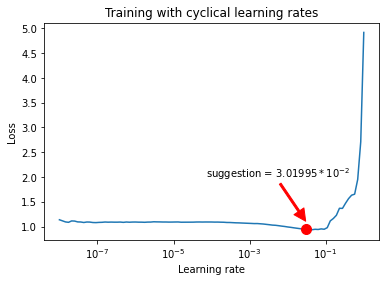

0.030199517204020192

In [0]:
# plot loss over diffrent learning rates
fig = lr_finder.plot(suggest=True)
plt.title("Training with cyclical learning rates")
plt.annotate('suggestion = ${:.6}*$'.format(lr_finder.suggestion()*100) + r'$10^{-2}$',
              xy=(lr_finder.suggestion(), 1.1),  xycoords='data',
              xytext=(0.7, 0.27), textcoords='axes fraction', 
              arrowprops=dict(color='red', shrink=0.01, width=2), 
              horizontalalignment='center', verticalalignment='bottom')
plt.savefig(filepath_plots+"/cyclical_learning_rates.pdf")
fig.show()
lr_finder.suggestion()

## Training

In [0]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=0.01, patience=20, verbose=False, mode="min")

trainer_multi = Trainer(max_epochs=101, 
                        gpus=1, 
                        log_every_n_steps=5, 
                        callbacks=[early_stop_callback])

model_multi = ResNet(n_classes=3, bs=batch_size_multi)
#model_multi.learning_rate = lr_finder.suggestion()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

In [0]:
trainer_multi.fit(model_multi, train_dataloader_multi, valid_dataloader_multi)

2022/01/25 10:46:07 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '9816d23368114718bdf338ef979c4510', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pytorch workflow
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

 Name | Type | Params
-------------------------------------------------
0 | feature_extractor | Sequential | 11.2 M
1 | classifier | Linear | 1.5 K 
-------------------------------------------------
11.2 M Trainable params
0 Non-trainable params
11.2 M Total params
44.712 Total estimated model params size (MB)
Validation sanity check: 0it [00:00, ?it/s]
Training: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]
Validating: 0it [00:00, ?it/s]

In [0]:
# load models
logged_model_multi = 'runs:/1c37605048204864babedf1d4c6cd6ea/model'
model_multi = mlflow.pytorch.load_model(logged_model_multi)

## Testing

In [0]:
res = trainer_multi.test(model_multi, dataloaders=test_dataloader_multi)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Testing: 0it [00:00, ?it/s]
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'val_f1_score': 0.7900640964508057, 'val_loss': -0.8820284605026245}
--------------------------------------------------------------------------------

In [0]:
pred = torch.cat([model_multi(X) for X, y in test_dataloader_multi])
y_pred = torch.argmax(pred, dim=1)
y = torch.cat([y for X, y in test_dataloader_multi])

precision recall f1-score support

 Normal 0.96 0.78 0.86 234
 Bacteria 0.70 0.97 0.81 242
 Virus 0.75 0.52 0.62 148

 accuracy 0.79 624
 macro avg 0.81 0.75 0.76 624
weighted avg 0.81 0.79 0.78 624

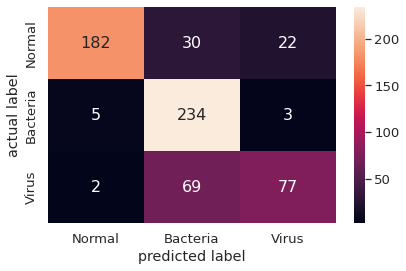

In [0]:
from sklearn.metrics import classification_report

print(classification_report(y, y_pred, target_names=test_multi.label2name.values()))

sns.set(font_scale=1.2)
confmat = ConfusionMatrix(3)
g = sns.heatmap(confmat(y_pred, y), annot=True, fmt='g',
                xticklabels=test_multi.label2name.values(),
                yticklabels=test_multi.label2name.values(),
                annot_kws={"fontsize":16})
g.set_yticklabels(labels=g.get_yticklabels(), va='center')
plt.xlabel('predicted label')
plt.ylabel('actual label')

plt.tight_layout()
plt.savefig(filepath_plots+"/confusion_multi.pdf")

precision recall f1-score support

 Normal 0.96 0.78 0.86 234
 Pneumonia 0.88 0.98 0.93 390

 accuracy 0.91 624
 macro avg 0.92 0.88 0.89 624
weighted avg 0.91 0.91 0.90 624

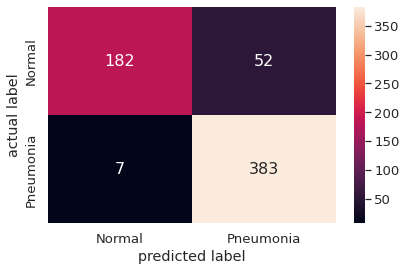

In [0]:
from sklearn.metrics import classification_report

y_pred_bin = y_pred > 0
y_bin = y > 0

print(classification_report(y_bin, y_pred_bin, target_names=['Normal', 'Pneumonia']))

sns.set(font_scale=1.2)
confmat = ConfusionMatrix(2)
g = sns.heatmap(confmat(y_pred_bin, y_bin), annot=True, fmt='g',
                xticklabels=['Normal', 'Pneumonia'],
                yticklabels=['Normal', 'Pneumonia'],
                annot_kws={"fontsize":16})
g.set_yticklabels(labels=g.get_yticklabels(), va='center')
plt.xlabel('predicted label')
plt.ylabel('actual label')

plt.tight_layout()
plt.savefig(filepath_plots+"/confusion_bin.pdf")

# Extend the basic decision support with XAI methods

## Grad-CAM

In [0]:
class ResNet_gradCam(ResNet):
  def __init__(self, model_trained):
    super().__init__()
    self.load_state_dict(model_trained.state_dict())
    self.eval()
  
  def forward(self, x):
    # change forward path to allow gradient calculation in the backbone net 
    representations = self.feature_extractor(x).flatten(1)
    return self.classifier(representations)  

model_cam = ResNet_gradCam(model_multi)

# recommentation for resnet18, see https://github.com/jacobgil/pytorch-grad-cam
target_layers = [model_cam.feature_extractor[-2][-1]]

In [0]:
def generate_grayscale_gradcam(idx, model, target_layers):
  if (type(idx) == np.int) | (type(idx) == np.int64):
    input_tensor = test_multi[idx][0].resize(1,3,224,224)
  elif (type(idx) == np.ndarray) | (type(idx) == list):
    input_tensor = torch.stack([test_multi[i][0] for i in idx])
  else:
    raise Exception('unhandable type {} for parameter idx'.format(type(idx)))
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)
  grayscale_cam = cam(input_tensor, aug_smooth=False, eigen_smooth=False)[0, :]
  return grayscale_cam

def generate_visu_gradcam(idx, model, target_layers, image_background_idx=None):
  grayscale_cam = generate_grayscale_gradcam(idx, model, target_layers)  
  if (type(image_background_idx) == np.int) | (type(image_background_idx) == np.int64):
    img = transforms_test(Image.open(test_multi.images[image_background_idx]).convert('RGB')).permute(1,2,0).numpy()
  elif (type(image_background_idx) == type(None)) & ((type(idx) == np.int) | (type(idx) == np.int64)):
    img = transforms_test(Image.open(test_multi.images[idx]).convert('RGB')).permute(1,2,0).numpy()
  else: 
    raise Exception('unhandable type {} or {} for parameter idx or image_background_idx'\
                    .format(type(idx), type(image_background_idx)))
    
  visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)
  return visualization
  
def show_gradcam_testset_multi(idxs, model, target_layers, n_rows, n_cols, figsize_scale=12, image_background_idx=None):
  fig = plt.figure(figsize=(n_rows*figsize_scale, n_cols*figsize_scale))
  for i, idx in enumerate(idxs):
    fig.add_subplot(n_rows, n_cols, i+1)
    visualization = generate_visu_gradcam(idx, model, target_layers, image_background_idx)
    plt.imshow(visualization)
    color_title = 'green' if (y[idx] == y_pred[idx]).all() else 'red'
    if (type(idx) == np.int) | (type(idx) == np.int64):
      plt.title('Act:{} Pred:{}'.format(test_multi.label2name[y[idx].tolist()], 
                                         test_multi.label2name[y_pred[idx].tolist()]), 
                color=color_title)
    elif (type(idx) == np.ndarray) | (type(idx) == list):
      plt.title('Act:{} Pred:{}'.format(test_multi.label2name[y[idx[0]].tolist()], 
                                       test_multi.label2name[y_pred[idx[0]].tolist()]), 
                color=color_title)
    else:
      raise Exception('unhandable type {} for parameter idx'.format(type(idx)))

Gaining trust on local predictions for domain experts

non-inplace resize is deprecated

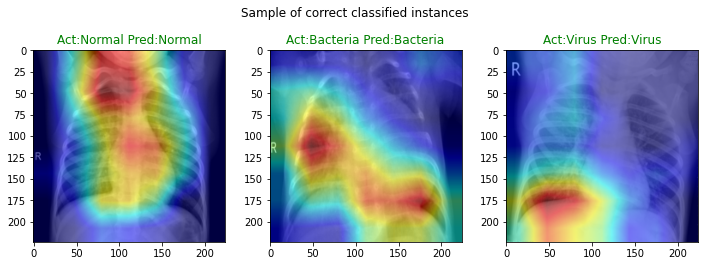

In [0]:
# idx ranges:  normal :233, bacteria 234:475, virus 476:
show_gradcam_testset_multi([10, 287, 502], model_cam, target_layers, 3, 3, 4)
fig = plt.gcf()

plt.savefig(filepath_plots+"gradcam_sample_correct.pdf", bbox_inches='tight')
fig.suptitle("Sample of correct classified instances", y=0.93)
plt.show()

### Check Testing results
Persona: Data Scientist who is interested in overall performance

non-inplace resize is deprecated

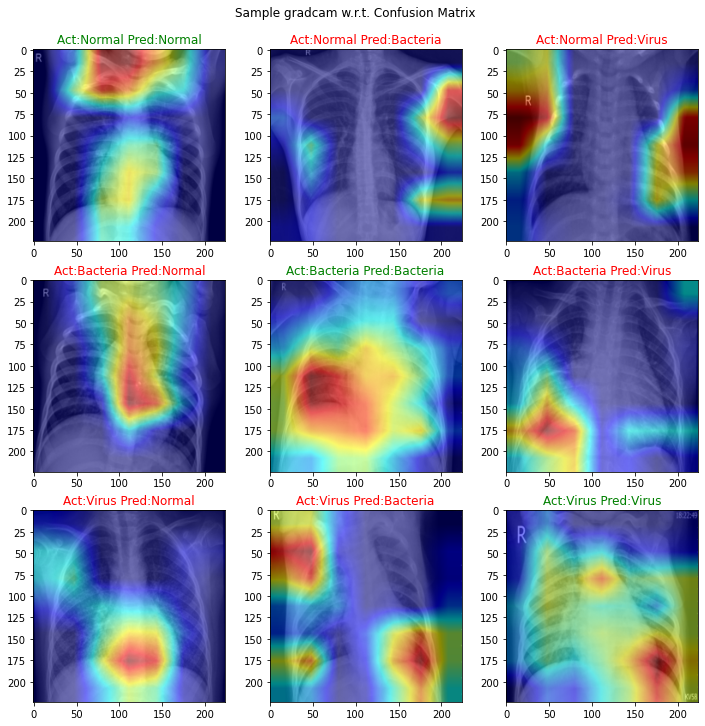

In [0]:
df_testing = pd.DataFrame({'y':y, 'y_pred':y_pred})
conf_mat_samples = [df_testing[(df_testing['y'] == act) & 
                               (df_testing['y_pred'] == pred)].sample(random_state=420).index.values[0] 
                     for act in [0,1,2] 
                     for pred in [0,1,2]]

show_gradcam_testset_multi(conf_mat_samples, model_cam, target_layers, 3, 3, 4)
fig = plt.gcf()

plt.savefig(filepath_plots+"gradcam_confmat_sample.pdf", bbox_inches='tight')
fig.suptitle("Sample gradcam w.r.t. Confusion Matrix", y=0.93)
plt.show()

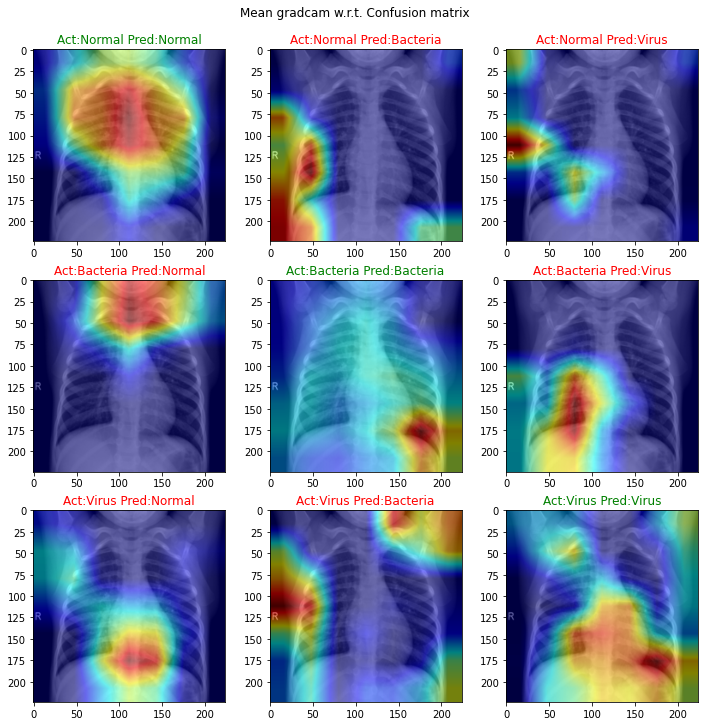

In [0]:
conf_mat_all = [df_testing[(df_testing['y'] == act) & 
                               (df_testing['y_pred'] == pred)].index.values 
                     for act in [0,1,2] 
                     for pred in [0,1,2]]

show_gradcam_testset_multi(conf_mat_all, model_cam, target_layers, 3, 3, 4, image_background_idx=10)
fig = plt.gcf()

plt.savefig(filepath_plots+"gradcam_confmat_mean.pdf", bbox_inches='tight')
fig.suptitle("Mean gradcam w.r.t. Confusion matrix", y=0.93)
plt.show()

### Dimension reduction of explanations for visualization (SpRAy)

In [0]:
# generate gradcam explanations over all test data and encode actual and predicted class
test_gradcam_all = [generate_visu_gradcam(i, model_cam, target_layers) for i,_ in enumerate(test_multi)]
test_gradcam_all_flat = np.array(test_gradcam_all)[:,:,:,0].reshape(len(test_multi),-1)  # pick one color chanel and flatten imgs

y_cat = pd.Categorical(["Act:{} Pred:{}".format(test_multi.label2name[row[0]],test_multi.label2name[row[1]]) for i,row in df_testing.iterrows()])

non-inplace resize is deprecated

In [0]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
test_gradcam_all_reduced = tsne.fit_transform(test_gradcam_all_flat)

In [0]:
def plot_grad_tsne(X, y_cat, images=None, min_distance=0.05, figsize=None, cbar=True):
    # plot reduced explanations
    X_normalized = MinMaxScaler().fit_transform(X)
    if figsize:
      plt.figure(figsize=figsize)
    plt.scatter(X_normalized[:, 0], X_normalized[:, 1], c=y_cat.codes, cmap="jet")
    plt.axis("off")
    if cbar:
      cbar = plt.colorbar(shrink=0.5)
      cbar.ax.set_yticklabels(y_cat.categories)
    if images:
      # add images to points regarding euclidian norm
      neighbors = np.array([[10., 10.]])
      ax = plt.gcf().gca()
      for index, image_coord in enumerate(X_normalized):
          closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
          if closest_distance > min_distance:
              neighbors = np.r_[neighbors, [image_coord]]
              image = images[index].reshape(224, 224, 3)
              imagebox = AnnotationBbox(OffsetImage(image, cmap="binary", zoom=0.2), image_coord)
              ax.add_artist(imagebox)

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

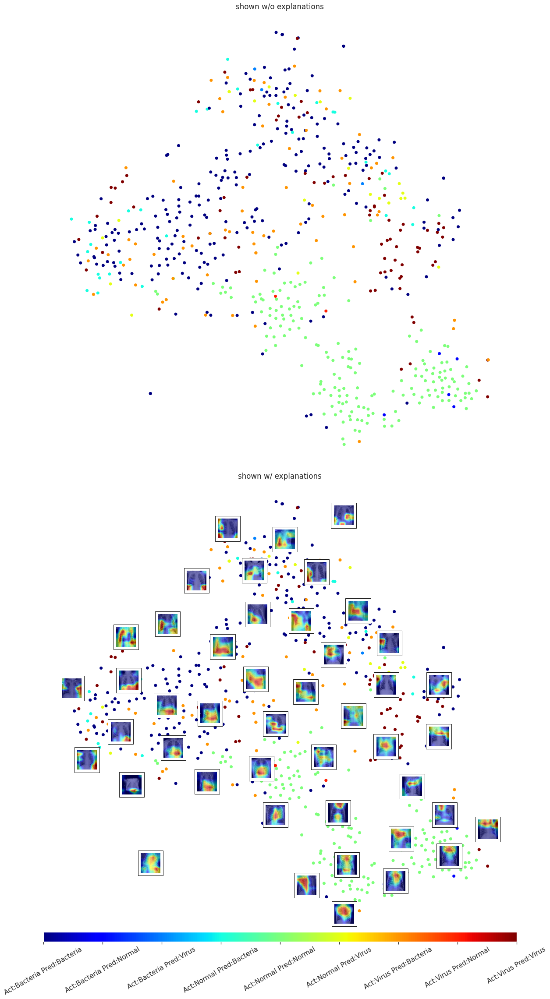

In [0]:
sns.set(font_scale=1.4)
fig = plt.figure(figsize=(15,30))

fig.add_subplot(211)
plot_grad_tsne(test_gradcam_all_reduced, y_cat, cbar=False)
plt.title("shown w/o explanations")

fig.add_subplot(212)
plot_grad_tsne(test_gradcam_all_reduced, y_cat, images=test_gradcam_all, min_distance=0.1, cbar=False)
plt.title("shown w/ explanations")

# colorbar
plt.subplots_adjust()
cax = plt.axes([0., 0., 1, 0.01])
cbar = plt.colorbar(cax=cax, shrink=0.5, orientation='horizontal')
cbar.locator = mpl.ticker.FixedLocator(np.arange(9))
cbar.formatter = mpl.ticker.FixedFormatter(y_cat.categories.values)
cbar.update_ticks()
cbar.ax.tick_params(rotation=30)

plt.tight_layout(pad=1)
plt.savefig(filepath_plots+"gradcam_tsne.pdf", bbox_inches='tight')
plt.show()
sns.reset_orig()

## DeepSHAP (DeepLIFT + SHAP)

In [0]:
# clean gpu memory
import gc
model_cam = model_cam.cuda()
gc.collect()
torch.cuda.empty_cache()

In [0]:
data_train_multi.transform = transforms_test  # applying the same transformation for both sets
idx_sampled_strat = pd.DataFrame(data_train_multi.labels).groupby(0).sample(50).index.values  # stratified sample for background _data
background_data = torch.stack([data_train_multi[i][0].cuda() for i in idx_sampled_strat])

# init DeepSHAP explainer
explainer = shap.DeepExplainer(model_cam, background_data)
print("expceted value " + str(explainer.expected_value))
print("test_pred mean " + str(pred.mean(axis=0).detach().numpy()))
print("test_pred std  " + str(pred.std(axis=0).detach().numpy()))

expceted value [-2.1268783 -0.3064455 -0.7437286]
test_pred mean [-2.1395705 -0.24507016 -0.77476245]
test_pred std [3.0153868 1.527866 1.0762839]

Since the model is much more confident in distinguishing the "normal" class (see test_pred mean), the expected value here turns out to be much higher, which is expressed by clearer values in the SHAP values, as the difference to the expected value is decisive here

### Check Testing results

In [0]:
explanation_data = torch.stack([test_multi[i][0].cuda() for i in conf_mat_samples])
shap_values = explainer.shap_values(explanation_data)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.

In [0]:
shap_values_numpy = [np.swapaxes(np.swapaxes(s, 1, -1), 1, 2) for s in shap_values]
explanation_data_numpy = np.swapaxes(np.swapaxes(explanation_data.cpu().numpy(), 1, -1), 1, 2)

In [0]:
from scipy.ndimage import zoom

def compress_shap_values(shap_values_numpy, reduce=8, M=224, N=224):
  "highlight stronger pixel-wise shap values"
  # filters
  K, L = reduce, reduce
  MK = M // K
  NL = N // L

  shap_values_reduced = shap_values_numpy.copy()
  for i,_ in enumerate(shap_values_numpy):
    for j,_ in enumerate(shap_values_numpy[i]):
      for c in [0,1,2]:
        mat = shap_values_numpy[i][j][:,:,c].copy()
        mat_min_max = np.array([mat[:MK*K, :NL*L].reshape(MK, K, NL, L).min(axis=(1, 3)), 
                                mat[:MK*K, :NL*L].reshape(MK, K, NL, L).max(axis=(1, 3))])
        idx_min_max = np.abs(mat_min_max).argmax(axis=0)
        new_mat = np.reshape([mat_min_max[idx_min_max[i,j],i,j] 
                              for i in range(mat_min_max.shape[1]) 
                              for j in range(mat_min_max.shape[2])],
                             (mat_min_max.shape[1],mat_min_max.shape[2]))
        new_mat = zoom(new_mat, reduce, order=0)
        shap_values_reduced[i][j][:,:,c] = new_mat
  return shap_values_reduced

shap_values_comp = compress_shap_values(shap_values_numpy, 4)

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

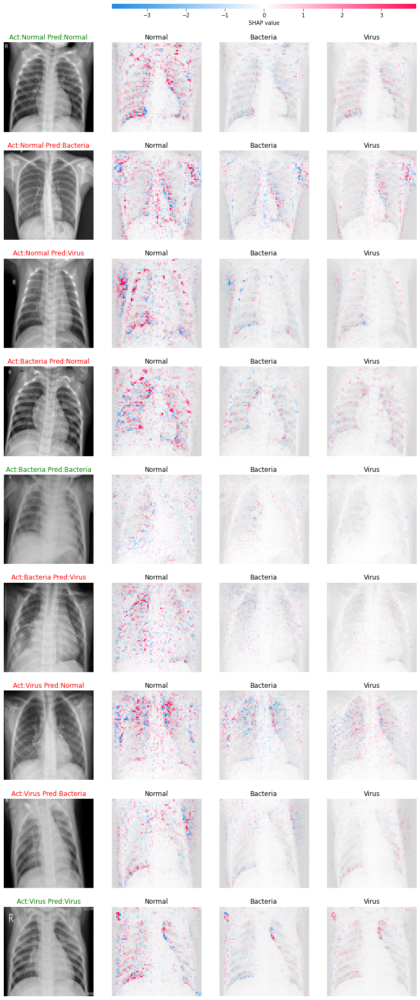

In [0]:
shap.image_plot(shap_values_comp, explanation_data_numpy, show=False, hspace=0.2,
                labels=[['Normal','Bacteria','Virus'] for i in range(len(explanation_data_numpy))])
fig = plt.gcf()
plt.tight_layout()

# plot titles
i = 0
for act in ['Normal','Bacteria','Virus']:
  for pred in ['Normal','Bacteria','Virus']:
    color_title = 'green' if act == pred else 'red'
    fig.axes[i].set_title("Act:{} Pred:{}".format(act,pred), color=color_title)
    i += 4

# set position of the color bar
fig.axes[-1].set_position((fig.axes[1].get_position().x0, 0.025,
                           fig.axes[3].get_position().x1 - fig.axes[1].get_position().x0, 1))

plt.savefig(filepath_plots+"deepshap_sample.pdf", bbox_inches='tight')
plt.show()

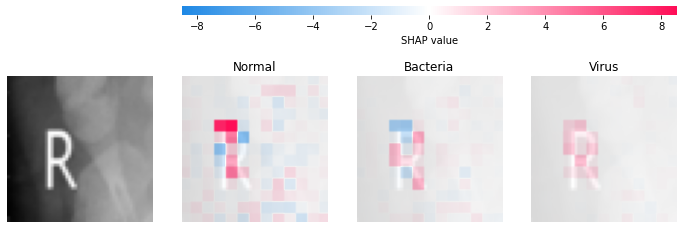

In [0]:
idx = 8
x_min, x_max = 0, 50
y_min, y_max = 0, 50

shap.image_plot(list(np.reshape(np.array(shap_values_numpy)[:,idx,y_min:y_max,x_min:x_max], 
                                (3, 1, y_max-y_min, x_max-x_min, 3))),
                np.reshape(explanation_data_numpy[idx,y_min:y_max,x_min:x_max], 
                           (1, y_max-y_min, x_max-x_min, 3)),
               labels=['Normal','Bacteria','Virus'], show=False)

fig = plt.gcf()
# set position of the color bar
fig.axes[-1].set_position((fig.axes[1].get_position().x0, -0.05,
                           fig.axes[3].get_position().x1 - fig.axes[1].get_position().x0, 1))

plt.savefig(filepath_plots+"deepshap_zoom.pdf", bbox_inches='tight')
plt.show()

# Appendix

### Adverserial Attacks/ Robustness
Attack and evaluate the Grad-CAM explanations and check their robustness
1) attack some samples
2) attack all images

In [0]:
def attack_by_patches(idx, patch_shapes):
  attacked_imgs = []
  for i, patch_shape in enumerate(patch_shapes):
    patch = torch.zeros(patch_shape)
    patch[:,:patch_shape[1],:patch_shape[2]] = torch.ones(1,patch_shape[1],patch_shape[2])
    # upper left
    attacked_img = test_multi[idx][0]
    attacked_img[:,:patch_shape[1],:patch_shape[2]] = patch
    attacked_imgs.append(attacked_img)
    # lower left
    attacked_img = test_multi[idx][0]
    attacked_img[:,-patch_shape[1]:,:patch_shape[2]] = patch
    attacked_imgs.append(attacked_img)
    # upper right
    attacked_img = test_multi[idx][0]
    attacked_img[:,:patch_shape[1],-patch_shape[2]:] = patch
    attacked_imgs.append(attacked_img)
    # lower right
    attacked_img = test_multi[idx][0]
    attacked_img[:,-patch_shape[1]:,-patch_shape[2]:] = patch
    attacked_imgs.append(attacked_img)  
  y_attack = [y[idx].tolist() for i in range(len(attacked_imgs))]
  attacked_imgs = torch.stack(attacked_imgs)
  return attacked_imgs, y_attack

In [0]:
def show_gradcam(input_tensors, y, model, target_layers, n_rows, n_cols, figsize_scale=12):
  fig = plt.figure(figsize=(n_rows*figsize_scale, n_cols*figsize_scale))
  for i, input_tensor in enumerate(input_tensors):
    fig.add_subplot(n_rows, n_cols, i+1)     
    plt.subplots_adjust(wspace=0.2, hspace=0.05)
    cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)    
    if len(input_tensor.shape) < 4:
      input_tensor = input_tensor.resize(1,3,224,224)
    grayscale_cam = cam(input_tensor, aug_smooth=False, eigen_smooth=False)[0, :]
    # pick first image as background
    visualization = show_cam_on_image(input_tensor[0].permute(1,2,0).numpy(), grayscale_cam, use_rgb=True)
    plt.imshow(visualization)
    plt.axis('off')
    # title: model output + correct y/n 
    pred = model(input_tensor.cuda()).detach()
    y_pred = torch.argmax(pred, dim=1)
    idx, count = y_pred.unique(return_counts=True)
    y_pred_major = idx[np.argmax(count.cpu())].tolist()
    color_title = 'green' if (y[i] == y_pred_major) else 'red'
    plt.title(np.round(pred.mean(axis=0).cpu().numpy(), 2), color=color_title)
  plt.tight_layout()
  return fig

def fig_to_img(fig, dpi=200):
  fig.set_dpi(dpi)
  plt.close(fig)
  canvas = fig.canvas
  canvas.draw()
  _, (width, height) = canvas.print_to_buffer()
  image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(width, height, 3)
  return image

def show_gradcam_to_img(input_tensors, y, model, target_layers, n_rows, n_cols, figsize_scale=12, dpi=200):
  fig = show_gradcam(input_tensors, y, model, target_layers, n_rows, n_cols, figsize_scale)
  image = fig_to_img(fig, dpi)
  return image

non-inplace resize is deprecated
elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

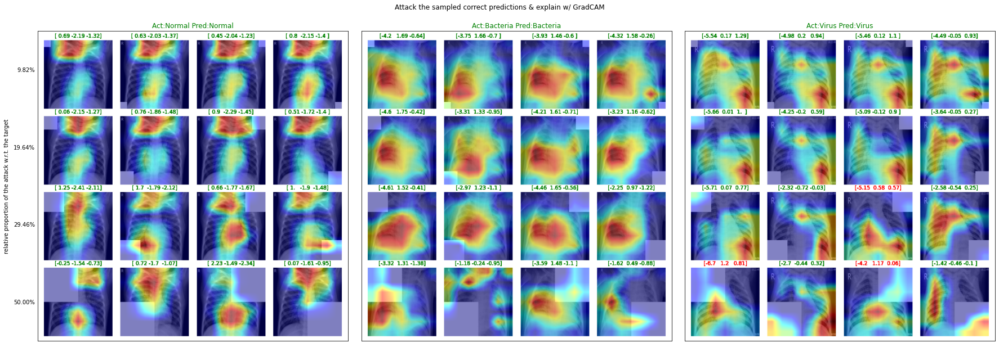

In [0]:
fig, axs = plt.subplots(1, 3, figsize=(25,25))
patch_shapes = [(3,22,22), (3,44,44), (3,66,66), (3,112,112)]

title = [("Act:{} Pred:{}".format(act,pred), 'green' if act == pred else 'red') 
          for act in ['Normal','Bacteria','Virus'] 
          for pred in ['Normal','Bacteria','Virus']]

for i, ax in enumerate(axs.flatten()):
  i = i*4  # only correct predictions
  idx = conf_mat_samples[i]
  attacked_imgs, y_attack = attack_by_patches(idx, patch_shapes)
  img = show_gradcam_to_img(attacked_imgs, y_attack, model_cam, target_layers, 4, 4, 2.5, dpi=100)
  ax.imshow(img)
  ax.set_xticks([])
  ax.set_yticks([])
  ax.set_title(title[i][0], color=title[i][1])
  # add yticks and label for relative proportion of the attack to the target
  if i == 0:
    ax.set_ylabel("relative proportion of the attack w.r.t. the target", labelpad=50)
    for j, patch_shape in enumerate(patch_shapes):
      len_y = ax.get_ybound()[1] - ax.get_ybound()[0]
      pos_y = len_y / 4 * (j+1) - len_y / 8
      attack_proportion = (np.array(patch_shape) / attacked_imgs[0].shape)[1:].mean()
      ax.text(-10, pos_y, "{:.2f}%".format(np.round(attack_proportion*100, 2)), ha="right", va="center")
  
plt.tight_layout(pad=2)  
plt.savefig(filepath_plots+"gradcam_advesarial_sample.pdf", bbox_inches='tight')
fig.suptitle("Attack the sampled correct predictions & explain w/ GradCAM", y=0.68)
plt.show()

In [0]:
conf_mat_correct = np.array(conf_mat_all)[[0,4,8]]
attacked_imgs_correctpred = torch.stack([attack_by_patches(idx, patch_shapes)[0] 
                                         for correctpred in conf_mat_correct 
                                         for idx in correctpred]).permute(1,0,2,3,4)
attacked_imgs_correctpred.shape

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
Out[121]: torch.Size([16, 493, 3, 224, 224])

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

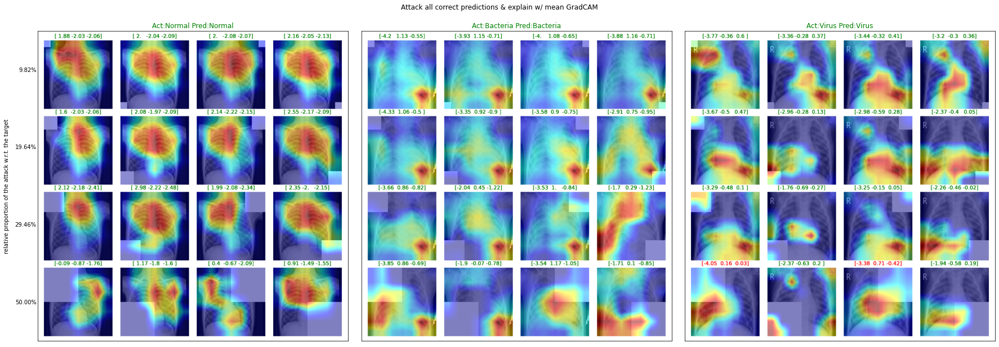

In [0]:
fig, axs = plt.subplots(1, 3, figsize=(25,25))
patch_shapes = [(3,22,22), (3,44,44), (3,66,66), (3,112,112)]
title = [("Act:{} Pred:{}".format(act_pred, act_pred), 'green') 
          for act_pred in ['Normal','Bacteria','Virus']]

offset = 0
for i, ax in enumerate(axs.flatten()):
  idx = len(conf_mat_correct[i])
  img = show_gradcam_to_img(attacked_imgs_correctpred[:, offset:offset+idx], [i]*16, 
                            model_cam, target_layers, 4, 4, 2.5)
  offset += idx
  ax.imshow(img)
  ax.set_xticks([])
  ax.set_yticks([])
  ax.set_title(title[i][0], color=title[i][1])
  # add yticks and label for relative proportion of the attack to the target
  if i == 0:
    ax.set_ylabel("relative proportion of the attack w.r.t. the target", labelpad=50)
    for j, patch_shape in enumerate(patch_shapes):
      len_y = ax.get_ybound()[1] - ax.get_ybound()[0]
      pos_y = len_y / 4 * (j+1) - len_y / 8
      attack_proportion = (np.array(patch_shape) / attacked_imgs[0].shape)[1:].mean()
      ax.text(-10, pos_y, "{:.2f}%".format(np.round(attack_proportion*100, 2)), ha="right", va="center")

plt.tight_layout(pad=2)
plt.savefig(filepath_plots+"gradcam_advesarial_mean.pdf", bbox_inches='tight')
fig.suptitle("Attack all correct predictions & explain w/ mean GradCAM", y=0.68)
plt.show()